## Trabajo Practico U2 - Espacios de Colores

In [155]:
## Librerias
import cv2, numpy as np
import matplotlib.pyplot as plt
import seaborn as sns


In [207]:
## Imagenes
img_1 = cv2.imread(str("./frutas.jpg")) ## Para trabajo RGB
img_2 = cv2.imread(str("./HSV_Color.webp")) ## Para trabajo RGB
img_3 = cv2.imread(str("./CIELAB.jpg")) ## Para trabajo CIELAB
img_4 = cv2.imread(str("./YCrCB.jpg")) ## Para trabajo YCrCB
img_5 = cv2.imread(str("./ByN-Gray.jpg")) ## Para trabajo ByN-Gray


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..1.0000001].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..1.0000001].


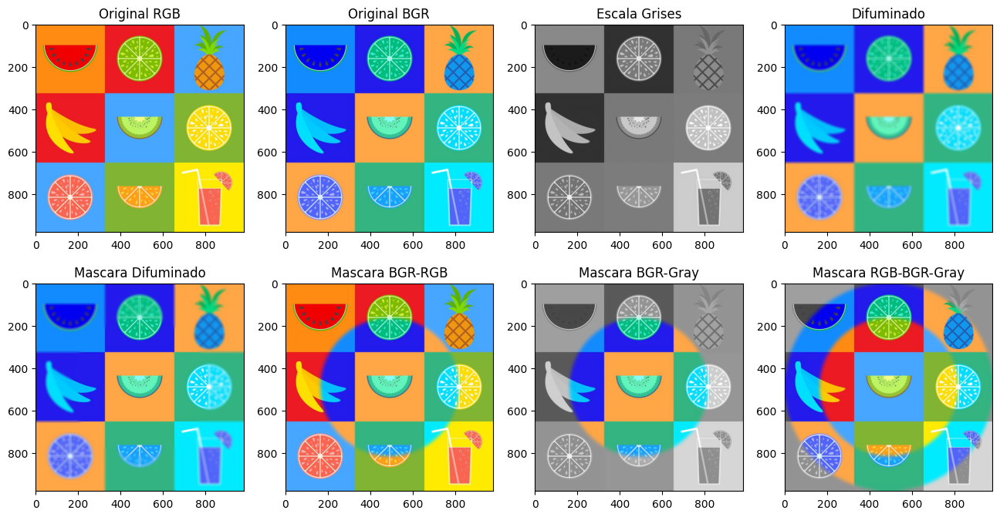

In [157]:
## Modificaciones RGB
h, w = img_1.shape[:2] ## Se obtienen las dimenciones de la imagen

img_1_f= img_1.astype(np.float32)/255.0 ## Normalizado de la imagen
img_1_RGB= cv2.cvtColor(img_1_f, cv2.COLOR_BGR2RGB)

mask= np.zeros((h, w), dtype=np.float32) ## Creacion de mascara circular de radio menor
cv2.circle(mask, (w//2,h//2), min(h,w)//3,1,-1)
mask = cv2.GaussianBlur(mask, (51,51),0)

mask2= np.zeros((h, w), dtype=np.float32) ## Creacopm de mascara circular de radio superior
cv2.circle(mask2, (w//2,h//2), min(h,w)//2,1,-1)
mask2 = cv2.GaussianBlur(mask2, (51,51),0)

blur= cv2.GaussianBlur(img_1_f, (15,15),290) ## Difuminacion de imagen

img_1_Gray = cv2.cvtColor(img_1_f, cv2.COLOR_BGR2GRAY) # Conversion a tono de grises

img_1_Gray_3c = img_1_Gray[:,:,np.newaxis] ## Aumentar a 3 canales
mask_3c = mask[:,:,np.newaxis]
mask2_3c = mask2[:,:,np.newaxis]

comp = img_1_f*mask_3c+blur*(1-mask_3c) ## Composiciones
compG= img_1_f*mask_3c+img_1_Gray_3c*(1-mask_3c)
compRGB= img_1_f*mask_3c+img_1_RGB*(1-mask_3c)
comp3= img_1_RGB*mask_3c+img_1_f*(mask2_3c-mask_3c)+img_1_Gray_3c*(1-mask2_3c)

comp_uint8 = (comp * 255).astype(np.uint8)

fig, axs= plt.subplots(2,4,figsize=(16,8)) ## Mostras imagenes
axs[0,0].imshow(img_1_RGB); axs[0,0].set_title("Original RGB")
axs[0,1].imshow(img_1_f); axs[0,1].set_title("Original BGR")
axs[0,2].imshow(img_1_Gray, cmap="gray"), axs[0,2].set_title("Escala Grises")
axs[0,3].imshow(blur), axs[0,3].set_title("Difuminado")
axs[1,0].imshow(comp), axs[1,0].set_title("Mascara Difuminado")
axs[1,1].imshow(compRGB), axs[1,1].set_title("Mascara BGR-RGB")
axs[1,2].imshow(compG), axs[1,2].set_title("Mascara BGR-Gray")
axs[1,3].imshow(comp3), axs[1,3].set_title("Mascara RGB-BGR-Gray")
plt.show()

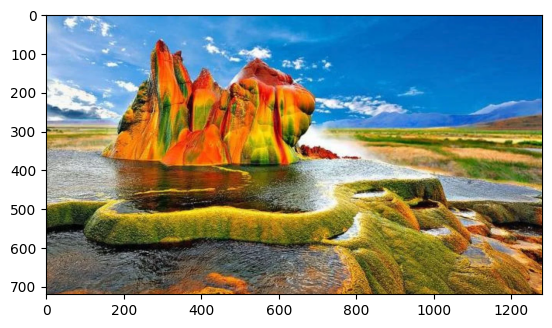

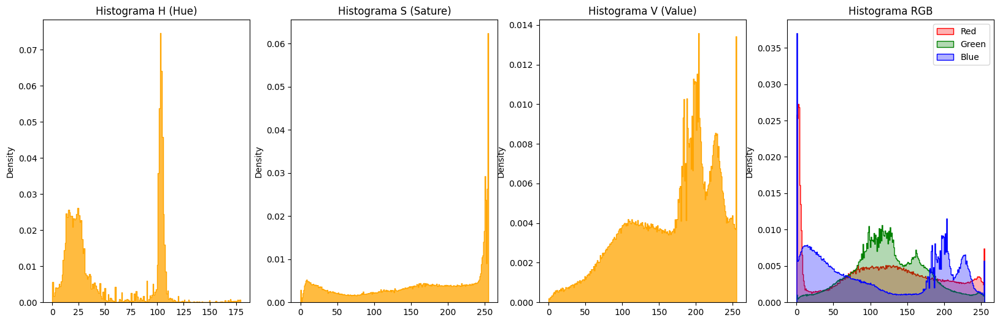

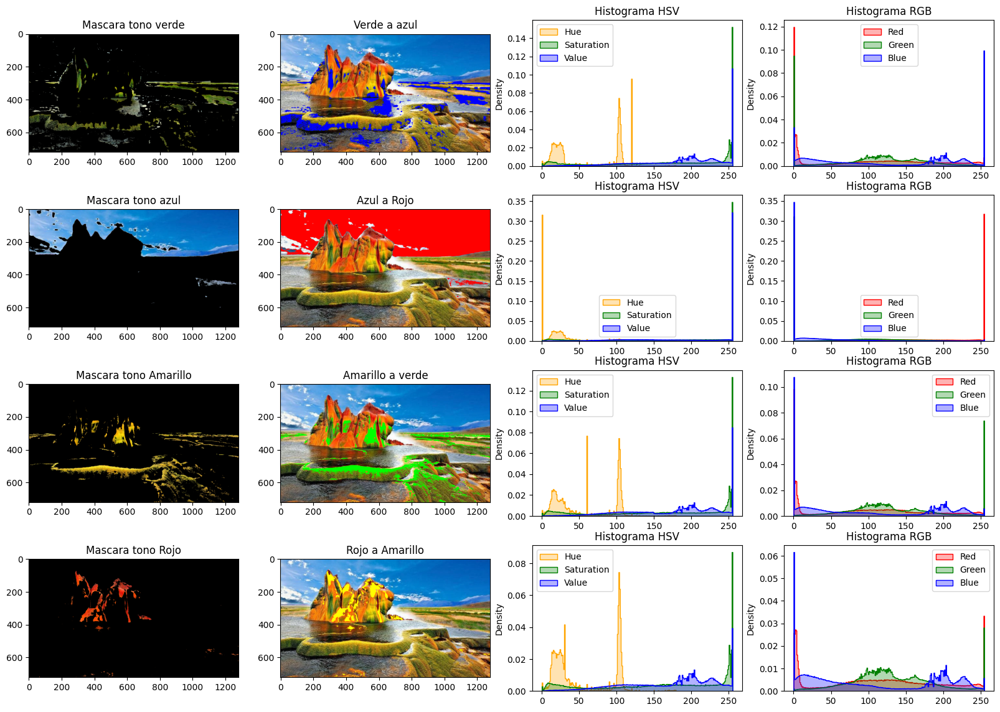

In [158]:
## Modificaciones HSV
img_2_RGB= cv2.cvtColor(img_2, cv2.COLOR_BGR2RGB)
hsv = cv2.cvtColor(img_2, cv2.COLOR_BGR2HSV)

R = img_2_RGB[:,:,0]  
G = img_2_RGB[:,:,1]
B = img_2_RGB[...,2]

H = hsv[:,:,0]  
S = hsv[:,:,1]
V = hsv[...,2]

min_img2_G = np.array([30, 20, 50], dtype=np.uint8) ## Deteccion verde
max_img2_G = np.array([90, 255, 255], dtype=np.uint8)

min_img2_B = np.array([90, 50, 150], dtype=np.uint8) ## Deteccion azul
max_img2_B = np.array([140, 255, 255], dtype=np.uint8)

min_img2_Y = np.array([20, 150, 150], dtype=np.uint8) ## Deteccion amarillo
max_img2_Y = np.array([30, 255, 255], dtype=np.uint8)

min_img2_R1 = np.array([0, 150, 150], dtype=np.uint8) ## Deteccion rojo
max_img2_R1 = np.array([10, 255, 255], dtype=np.uint8)
min_img2_R2 = np.array([170, 150, 150], dtype=np.uint8)
max_img2_R2 = np.array([180, 255, 255], dtype=np.uint8)

mask_img2_G = cv2.inRange(hsv, min_img2_G, max_img2_G) ## Mascara en verde
res_g  = cv2.bitwise_and(img_2_RGB, img_2_RGB, mask=mask_img2_G)

mask_img2_B = cv2.inRange(hsv, min_img2_B, max_img2_B) ## Mascara en azul
res_b  = cv2.bitwise_and(img_2_RGB, img_2_RGB, mask=mask_img2_B)

mask_img2_Y = cv2.inRange(hsv, min_img2_Y, max_img2_Y) ## Mascara en Amarillo
res_y  = cv2.bitwise_and(img_2_RGB, img_2_RGB, mask=mask_img2_Y)

mask_img2_R1 = cv2.inRange(hsv, min_img2_R1, max_img2_R1) ## Mascara en Rojo
mask_img2_R2 = cv2.inRange(hsv, min_img2_R2, max_img2_R2)
mask_img2_R = cv2.bitwise_or(mask_img2_R1, mask_img2_R2)
res_r  = cv2.bitwise_and(img_2_RGB, img_2_RGB, mask=mask_img2_R)

img2_G2B = img_2.copy()
img2_G2B[mask_img2_G>0] = (255,0,0)
img2_G2B_RGB= cv2.cvtColor(img2_G2B, cv2.COLOR_BGR2RGB)
img2_G2B_HSV= cv2.cvtColor(img2_G2B, cv2.COLOR_BGR2HSV)

R_G2B = img2_G2B_RGB[:,:,0]  
G_G2B = img2_G2B_RGB[:,:,1]
B_G2B = img2_G2B_RGB[...,2]

H_G2B = img2_G2B_HSV[:,:,0]  
S_G2B = img2_G2B_HSV[:,:,1]
V_G2B = img2_G2B_HSV[...,2]

img2_B2R = img_2.copy()
img2_B2R[mask_img2_B>0] = (0,0,255)
img2_B2R_RGB= cv2.cvtColor(img2_B2R, cv2.COLOR_BGR2RGB)
img2_B2R_HSV= cv2.cvtColor(img2_B2R, cv2.COLOR_BGR2HSV)

R_B2R = img2_B2R_RGB[:,:,0]  
G_B2R = img2_B2R_RGB[:,:,1]
B_B2R = img2_B2R_RGB[...,2]

H_B2R = img2_B2R_HSV[:,:,0]  
S_B2R = img2_B2R_HSV[:,:,1]
V_B2R = img2_B2R_HSV[...,2]

img2_Y2G = img_2.copy()
img2_Y2G[mask_img2_Y>0] = (0,255,0)
img2_Y2G_RGB= cv2.cvtColor(img2_Y2G, cv2.COLOR_BGR2RGB)
img2_Y2G_HSV= cv2.cvtColor(img2_Y2G, cv2.COLOR_BGR2HSV)

R_Y2G = img2_Y2G_RGB[:,:,0]  
G_Y2G = img2_Y2G_RGB[:,:,1]
B_Y2G = img2_Y2G_RGB[...,2]

H_Y2G = img2_Y2G_HSV[:,:,0]  
S_Y2G = img2_Y2G_HSV[:,:,1]
V_Y2G = img2_Y2G_HSV[...,2]

img2_R2Y = img_2.copy()
img2_R2Y[mask_img2_R>0] = (0,255,255)
img2_R2Y_RGB= cv2.cvtColor(img2_R2Y, cv2.COLOR_BGR2RGB)
img2_R2Y_HSV= cv2.cvtColor(img2_R2Y, cv2.COLOR_BGR2HSV)

R_R2Y = img2_R2Y_RGB[:,:,0]  
G_R2Y = img2_R2Y_RGB[:,:,1]
B_R2Y = img2_R2Y_RGB[...,2]

H_R2Y = img2_R2Y_HSV[:,:,0]  
S_R2Y = img2_R2Y_HSV[:,:,1]
V_R2Y = img2_R2Y_HSV[...,2]

plt.figure()
plt.imshow(img_2_RGB)

fig, axs= plt.subplots(1,4,figsize=(20,6)) ## Mostras imagenes


sns.histplot(H.ravel(), bins=180, binrange=(0,179), stat="density", element="step", color='orange', ax=axs[0])
axs[0].set_title("Histograma H (Hue)")
sns.histplot(S.ravel(), bins=256, binrange=(0,255), stat="density", element="step", color='orange', ax=axs[1])
axs[1].set_title("Histograma S (Sature)")
sns.histplot(V.ravel(), bins=256, binrange=(0,255), stat="density", element="step", color='orange', ax=axs[2])
axs[2].set_title("Histograma V (Value)")
for ch, col, name in [(R, "r", "Red"), (G, "g", "Green"), (B, "b", "Blue")]:
    sns.histplot(ch.ravel(), bins=256, binrange=(0,255), stat="density", element="step", fill=True, alpha=0.3, color=col, label=name, ax=axs[3])
axs[3].set_title("Histograma RGB"); axs[3].legend()

fig, axs1= plt.subplots(4,4,figsize=(20,14))

axs1[0,0].imshow(res_g), axs1[0,0].set_title("Mascara tono verde")
axs1[0,1].imshow(img2_G2B_RGB), axs1[0,1].set_title("Verde a azul")
for hv2, e2, label2 in [(H_G2B, "orange", "Hue"), (S_G2B, "green", "Saturation"), (V_G2B, "blue", "Value")]:
    sns.histplot(hv2.ravel(), bins=256, binrange=(0,255), stat="density", element="step", fill=True, alpha=0.3, color=e2, label=label2, ax=axs1[0,2])
axs1[0,2].set_title("Histograma HSV"); axs1[0,2].legend()
for ch2, col2, name2 in [(R_G2B, "r", "Red"), (G_G2B, "g", "Green"), (B_G2B, "b", "Blue")]:
    sns.histplot(ch2.ravel(), bins=256, binrange=(0,255), stat="density", element="step", fill=True, alpha=0.3, color=col2, label=name2, ax=axs1[0,3])
axs1[0,3].set_title("Histograma RGB"); axs1[0,3].legend()

axs1[1,0].imshow(res_b), axs1[1,0].set_title("Mascara tono azul")
axs1[1,1].imshow(img2_B2R_RGB), axs1[1,1].set_title("Azul a Rojo")
for hv3, e3, label3 in [(H_B2R, "orange", "Hue"), (S_B2R, "green", "Saturation"), (V_B2R, "blue", "Value")]:
    sns.histplot(hv3.ravel(), bins=256, binrange=(0,255), stat="density", element="step", fill=True, alpha=0.3, color=e3, label=label3, ax=axs1[1,2])
axs1[1,2].set_title("Histograma HSV"); axs1[1,2].legend()
for ch3, col3, name3 in [(R_B2R, "r", "Red"), (G_B2R, "g", "Green"), (B_B2R, "b", "Blue")]:
    sns.histplot(ch3.ravel(), bins=256, binrange=(0,255), stat="density", element="step", fill=True, alpha=0.3, color=col3, label=name3, ax=axs1[1,3])
axs1[1,3].set_title("Histograma RGB"); axs1[1,3].legend()

axs1[2,0].imshow(res_y), axs1[2,0].set_title("Mascara tono Amarillo")
axs1[2,1].imshow(img2_Y2G_RGB), axs1[2,1].set_title("Amarillo a verde")
for hv4, e4, label4 in [(H_Y2G, "orange", "Hue"), (S_Y2G, "green", "Saturation"), (V_Y2G, "blue", "Value")]:
    sns.histplot(hv4.ravel(), bins=256, binrange=(0,255), stat="density", element="step", fill=True, alpha=0.3, color=e4, label=label4, ax=axs1[2,2])
axs1[2,2].set_title("Histograma HSV"); axs1[2,2].legend()
for ch4, col4, name4 in [(R_Y2G, "r", "Red"), (G_Y2G, "g", "Green"), (B_Y2G, "b", "Blue")]:
    sns.histplot(ch4.ravel(), bins=256, binrange=(0,255), stat="density", element="step", fill=True, alpha=0.3, color=col4, label=name4, ax=axs1[2,3])
axs1[2,3].set_title("Histograma RGB"); axs1[2,3].legend()

axs1[3,0].imshow(res_r), axs1[3,0].set_title("Mascara tono Rojo")
axs1[3,1].imshow(img2_R2Y_RGB), axs1[3,1].set_title("Rojo a Amarillo")
for hv5, e5, label5 in [(H_R2Y, "orange", "Hue"), (S_R2Y, "green", "Saturation"), (V_R2Y, "blue", "Value")]:
    sns.histplot(hv5.ravel(), bins=256, binrange=(0,255), stat="density", element="step", fill=True, alpha=0.3, color=e5, label=label5, ax=axs1[3,2])
axs1[3,2].set_title("Histograma HSV"); axs1[3,2].legend()
for ch5, col5, name5 in [(R_R2Y, "r", "Red"), (G_R2Y, "g", "Green"), (B_R2Y, "b", "Blue")]:
    sns.histplot(ch5.ravel(), bins=256, binrange=(0,255), stat="density", element="step", fill=True, alpha=0.3, color=col5, label=name5, ax=axs1[3,3])
axs1[3,3].set_title("Histograma RGB"); axs1[3,3].legend()

plt.show()

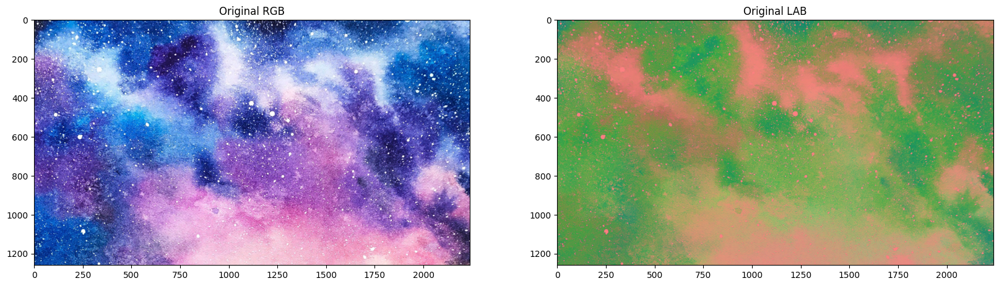

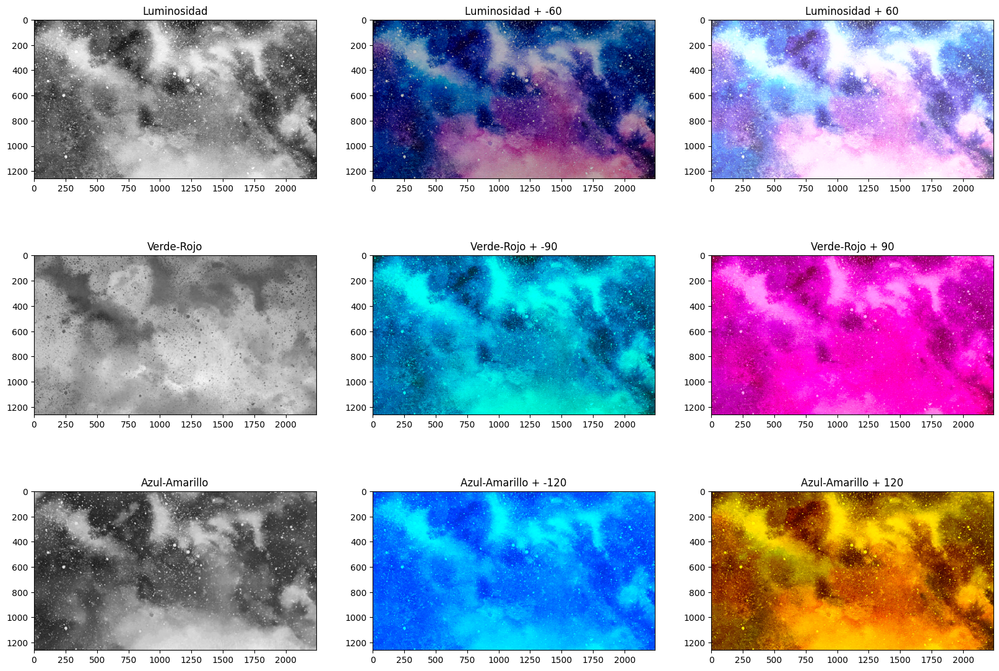

In [179]:
## Modificaciones HSV
img_3_RGB= cv2.cvtColor(img_3, cv2.COLOR_BGR2RGB)
img3_Lab = cv2.cvtColor(img_3, cv2.COLOR_BGR2LAB)

fig, axs2= plt.subplots(1,2,figsize=(20,8))
axs2[0].imshow(img_3_RGB), axs2[0].set_title("Original RGB")
axs2[1].imshow(img3_Lab), axs2[1].set_title("Original LAB")
plt.show()

L, a, b = cv2.split(img3_Lab)

## Aumentar luminosidad
Lum = 60
n_Lum= Lum*(-1)
L_HB= cv2.add(L, Lum)
L_HB_n= cv2.add(L, n_Lum)

img3_lab_HB = cv2.merge([L_HB, a, b])
img3_lab_HB_n = cv2.merge([L_HB_n, a, b])
img3_lab_HB_RGB = cv2.cvtColor(img3_lab_HB, cv2.COLOR_LAB2RGB)
img3_lab_HB_n_RGB = cv2.cvtColor(img3_lab_HB_n, cv2.COLOR_LAB2RGB)

L_hb, a_hb, b_hb = cv2.split(img3_lab_HB)

## Aumentar Verde-Rojo
GR = 90
n_GR= GR*(-1)
a_GR= cv2.add(a, GR)
a_GR_n= cv2.add(a, n_GR)

img3_lab_GR = cv2.merge([L, a_GR, b])
img3_lab_GR_n = cv2.merge([L, a_GR_n, b])
img3_lab_GR_RGB = cv2.cvtColor(img3_lab_GR, cv2.COLOR_LAB2RGB)
img3_lab_GR_n_RGB = cv2.cvtColor(img3_lab_GR_n, cv2.COLOR_LAB2RGB)

L_GR, a_GR, b_GR = cv2.split(img3_lab_GR)

## Aumentar Azul-Amarillo
AY = 120
n_AY = AY*(-1)
b_AY= cv2.add(b, AY)
b_AY_n= cv2.add(b, n_AY)

img3_lab_AY = cv2.merge([L, a, b_AY])
img3_lab_AY_n = cv2.merge([L, a, b_AY_n])
img3_lab_AY_RGB = cv2.cvtColor(img3_lab_AY, cv2.COLOR_LAB2RGB)
img3_lab_AY_n_RGB = cv2.cvtColor(img3_lab_AY_n, cv2.COLOR_LAB2RGB)

L_AY, a_AY, b_AY = cv2.split(img3_lab_AY)


fig, axs3= plt.subplots(3,3,figsize=(20,14))
axs3[0,0].imshow(L, cmap="gray"), axs3[0,0].set_title("Luminosidad")
axs3[0,1].imshow(img3_lab_HB_n_RGB), axs3[0,1].set_title(f"Luminosidad + {n_Lum}")
axs3[0,2].imshow(img3_lab_HB_RGB), axs3[0,2].set_title(f"Luminosidad + {Lum}")
axs3[1,0].imshow(a, cmap="gray"), axs3[1,0].set_title("Verde-Rojo")
axs3[1,1].imshow(img3_lab_GR_n_RGB), axs3[1,1].set_title(f"Verde-Rojo + {n_GR}")
axs3[1,2].imshow(img3_lab_GR_RGB), axs3[1,2].set_title(f"Verde-Rojo + {GR}")
axs3[2,0].imshow(b, cmap="gray"), axs3[2,0].set_title("Azul-Amarillo")
axs3[2,1].imshow(img3_lab_AY_n_RGB), axs3[2,1].set_title(f"Azul-Amarillo + {n_AY}")
axs3[2,2].imshow(img3_lab_AY_RGB), axs3[2,2].set_title(f"Azul-Amarillo + {AY}")

plt.show()

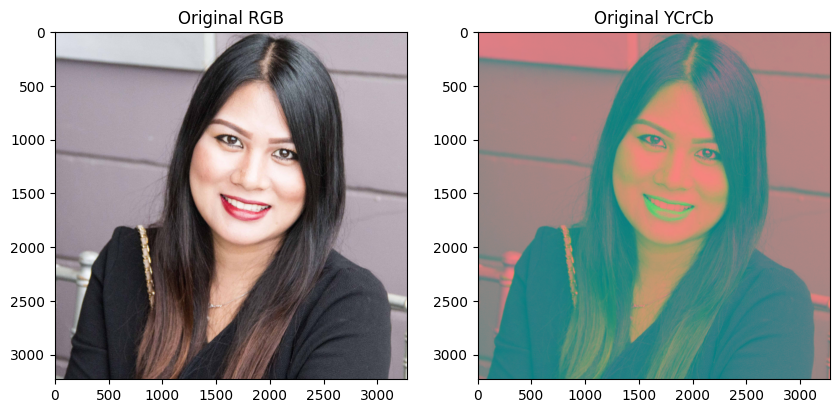

(<matplotlib.image.AxesImage at 0x22386546d50>, Text(0.5, 1.0, 'Rostro'))

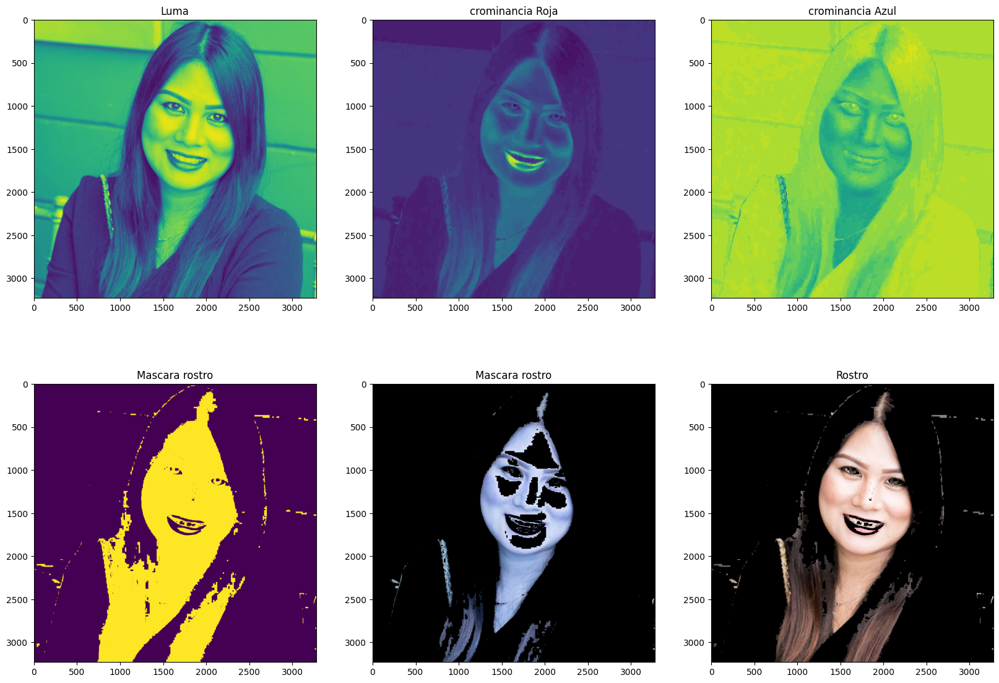

In [206]:
## Modificaciones YCrCb
img_4_RGB= cv2.cvtColor(img_4, cv2.COLOR_BGR2RGB)
img4_YCrCb = cv2.cvtColor(img_4, cv2.COLOR_BGR2YCrCb)

fig, axs2= plt.subplots(1,2,figsize=(10,8))
axs2[0].imshow(img_4_RGB), axs2[0].set_title("Original RGB")
axs2[1].imshow(img4_YCrCb), axs2[1].set_title("Original YCrCb")
plt.show()

Y, Cr, Cb = cv2.split(img4_YCrCb)

lower = (0, 133, 77)
upper = (255, 173, 127)

mask_YCrCb = cv2.inRange(img4_YCrCb, lower, upper)

skin1 = cv2.bitwise_and(img_4, img_4, mask=mask_YCrCb)
skin2 = cv2.bitwise_and(img_4_RGB, img_4_RGB, mask=mask_YCrCb)

fig, axs4= plt.subplots(2,3,figsize=(20,14))
axs4[0,0].imshow(Y), axs4[0,0].set_title("Luma")
axs4[0,1].imshow(Cr), axs4[0,1].set_title("crominancia Roja")
axs4[0,2].imshow(Cb), axs4[0,2].set_title("crominancia Azul")
axs4[1,0].imshow(mask_YCrCb), axs4[1,0].set_title("Mascara rostro")
axs4[1,1].imshow(skin), axs4[1,1].set_title("Mascara rostro")
axs4[1,2].imshow(skin2), axs4[1,2].set_title("Rostro")


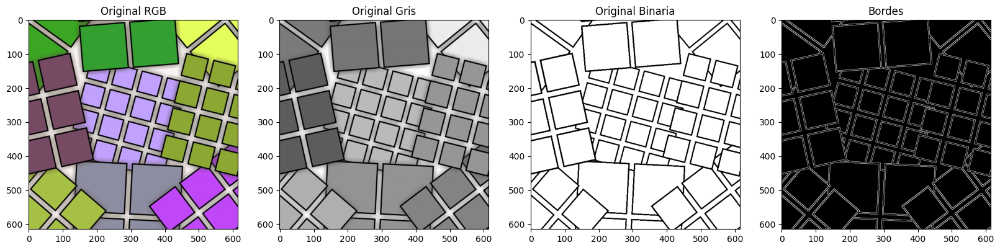

In [223]:
## Modificaciones YCrCb
img_5_RGB= cv2.cvtColor(img_5, cv2.COLOR_BGR2RGB)
img5_Gray = cv2.cvtColor(img_5, cv2.COLOR_BGR2GRAY)

umbral = 80
_,img5_Bin = cv2.threshold(img5_Gray, umbral, 255, cv2.THRESH_BINARY)

## Deteccion de borde canny
minV= 50 ## por debajo no considera borde
maxV= 150 ## por encima, bordes fuertes

Canny= cv2.Canny(img5_Gray,minV,maxV)

fig, axs2= plt.subplots(1,4,figsize=(20,8))
axs2[0].imshow(img_5_RGB), axs2[0].set_title("Original RGB")
axs2[1].imshow(img5_Gray, cmap="gray"), axs2[1].set_title("Original Gris")
axs2[2].imshow(img5_Bin, cmap="gray"), axs2[2].set_title("Original Binaria")
axs2[3].imshow(Canny, cmap="gray"), axs2[3].set_title("Bordes")
plt.show()


plt.show()

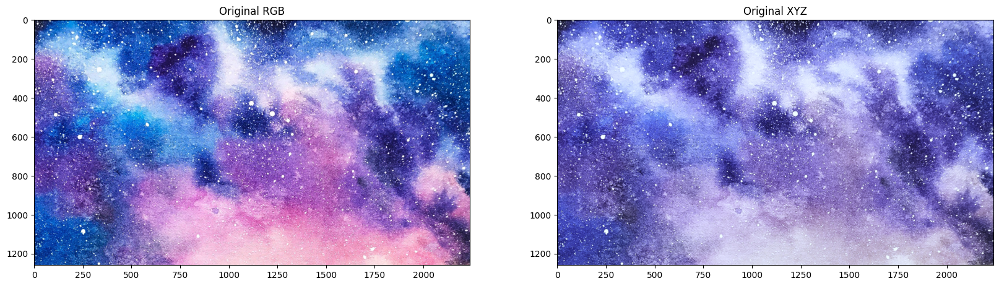

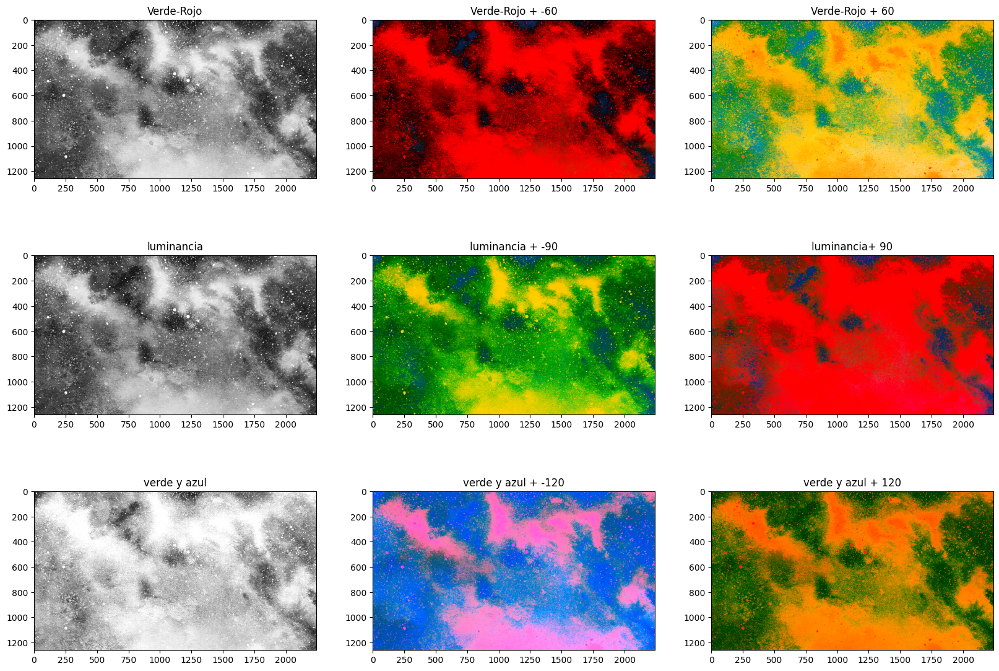

In [227]:
## Modificaciones XYZ
img_3_RGB= cv2.cvtColor(img_3, cv2.COLOR_BGR2RGB)
img3_XYZ = cv2.cvtColor(img_3, cv2.COLOR_BGR2XYZ)

fig, axs2= plt.subplots(1,2,figsize=(20,8))
axs2[0].imshow(img_3_RGB), axs2[0].set_title("Original RGB")
axs2[1].imshow(img3_XYZ), axs2[1].set_title("Original XYZ")
plt.show()

X, Y, Z = cv2.split(img3_XYZ)

## Combinacion Rojo y Verde
RV = 60
n_RV= RV*(-1)
X_RV= cv2.add(X, RV)
X_RV_n= cv2.add(X, n_RV)

img3_XYZ_RV = cv2.merge([X_RV, Y, Z])
img3_XYZ_RV_n = cv2.merge([X_RV_n, Z, Z])
img3_XYZ_RV_RGB = cv2.cvtColor(img3_XYZ_RV, cv2.COLOR_LAB2RGB)
img3_XYZ_RV_n_RGB = cv2.cvtColor(img3_XYZ_RV_n, cv2.COLOR_LAB2RGB)

## luminancia
Lumi = 90
n_Lumi= Lumi*(-1)
Y_Lumi= cv2.add(Y, Lumi)
Y_Lumi_n= cv2.add(Y, n_Lumi)

img3_XYZ_Lumi = cv2.merge([X, Y_Lumi, Z])
img3_XYZ_Lumi_n = cv2.merge([X, Y_Lumi_n, Z])
img3_XYZ_Lumi_RGB = cv2.cvtColor(img3_XYZ_Lumi, cv2.COLOR_LAB2RGB)
img3_XYZ_Lumi_n_RGB = cv2.cvtColor(img3_XYZ_Lumi_n, cv2.COLOR_LAB2RGB)

## verde y azul
VA = 120
n_VA = VA*(-1)
b_VA= cv2.add(Z, VA)
b_VA_n= cv2.add(Z, n_VA)

img3_XYZ_VA = cv2.merge([X,Y,b_VA])
img3_XYZ_VA_n = cv2.merge([X,Y,b_VA_n])
img3_XYZ_VA_RGB = cv2.cvtColor(img3_XYZ_VA , cv2.COLOR_LAB2RGB)
img3_XYZ_VA_n_RGB = cv2.cvtColor(img3_XYZ_VA_n, cv2.COLOR_LAB2RGB)


fig, axs3= plt.subplots(3,3,figsize=(20,14))
axs3[0,0].imshow(X, cmap="gray"), axs3[0,0].set_title("Verde-Rojo")
axs3[0,1].imshow(img3_XYZ_RV_n_RGB), axs3[0,1].set_title(f"Verde-Rojo + {n_RV}")
axs3[0,2].imshow(img3_XYZ_RV_RGB), axs3[0,2].set_title(f"Verde-Rojo + {RV}")
axs3[1,0].imshow(Y, cmap="gray"), axs3[1,0].set_title("luminancia")
axs3[1,1].imshow(img3_XYZ_Lumi_n_RGB), axs3[1,1].set_title(f"luminancia + {n_Lumi}")
axs3[1,2].imshow(img3_XYZ_Lumi_RGB), axs3[1,2].set_title(f"luminancia+ {Lumi}")
axs3[2,0].imshow(Z, cmap="gray"), axs3[2,0].set_title("verde y azul")
axs3[2,1].imshow(img3_XYZ_VA_n_RGB), axs3[2,1].set_title(f"verde y azul + {n_VA}")
axs3[2,2].imshow(img3_XYZ_VA_RGB), axs3[2,2].set_title(f"verde y azul + {VA}")

plt.show()